In [19]:
%matplotlib inline

import json
import matplotlib.pyplot as plt
import os
from shapely.geometry import asShape
from shapely.affinity import translate
from descartes import PolygonPatch

In [45]:
data = json.load(open("./data/colombia_only_pol.geojson"))

<bound method _AxesBase.clear of <matplotlib.axes._subplots.AxesSubplot object at 0x7f8962babd68>>

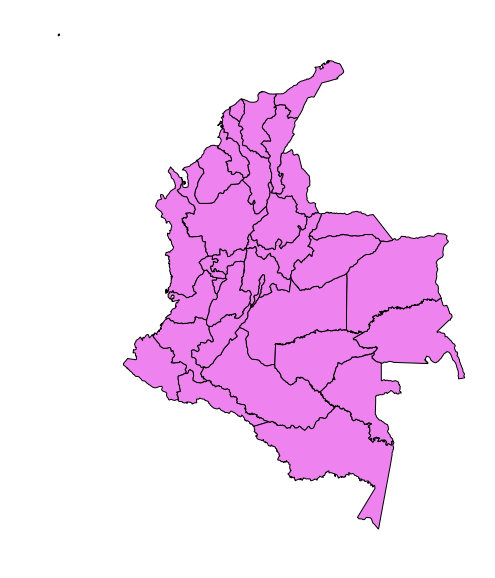

In [46]:
fig = plt.figure(figsize=(8, 10))
plt.axis('off')
ax = fig.gca() 

for feat in data["features"]:
    geom = asShape(feat["geometry"])
    geom = translate(geom, xoff=0, yoff=0, zoff=0.0)
    x, y = geom.centroid.x, geom.centroid.y
    ax.plot(x, y, '-')
    ax.add_patch(PolygonPatch(feat["geometry"], fc='violet', ec='black',
                alpha=1, lw=1, ls='-', zorder=2))
ax.clear

In [31]:
geom = translate(geom, xoff=0.0, yoff=5, zoff=0.0)

In [32]:
geom.centroid.y

17.911343102637655

In [10]:
import folium
import folium.plugins
from folium.features import *

In [77]:
colombia_map_0 = os.path.join('data', 'colombia.geojson')
colombia_map_1 = os.path.join('data', 'colombia_traslated.geojson')
colombia_map_2 = os.path.join('data', 'colombia_traslated_2.geojson')
colombia_map_3 = os.path.join('data', 'colombia_traslated_3.geojson')
colombia_map_4 = os.path.join('data', 'colombia_traslated_4.geojson')
colombia_map_5 = os.path.join('data', 'colombia_traslated_5.geojson')
colombia_map_6 = os.path.join('data', 'colombia_traslated_6.geojson')

maps = [colombia_map_0, colombia_map_1, colombia_map_2, colombia_map_3, colombia_map_4, colombia_map_5, colombia_map_6]

m = folium.Map(
    location=[-59.1759, -11.6016],
    tiles='Mapbox Bright',
    zoom_start=2
)

def style_function(feature):
    return {'weight':'1'}

for map_instance in maps:
    folium.GeoJson(
        map_instance,
        name='geojson',
        style_function=style_function
    ).add_to(m)

folium.LayerControl().add_to(m)

m